## Step 1. 스티커 구하기  

이미지 저장 디렉터리 생성  
`$ mkdir -p ~/aiffel/camera_sticker/models`  
`$ mkdir -p ~/aiffel/camera_sticker/images` 
  
이미지 파일 연결  
`$ ln -s ~/data/* ~/aiffel/camera_sticker/images`

### 관련 라이브러리 읽어오기

In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib
print("🌫🛸")

🌫🛸


### 셀카 사진 이미지 읽기
- 이미지 파일 이름 지정

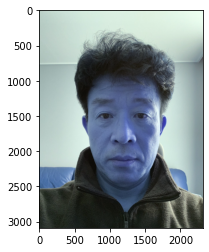

In [2]:
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie_front.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

### 이미지 보정하기 (bgr > rgb)

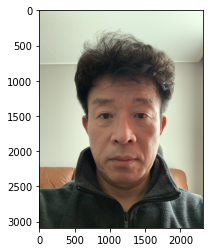

In [3]:
# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

## Step 2. 얼굴 검출 및 랜드마크 검출  

### dlib을 활용해 hog detector를 선언

In [4]:
# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("🌫🛸")

🌫🛸


### detector_hog를 이용해서 얼굴의 bounding box를 추출

In [5]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("🌫🛸")

🌫🛸


### 찾은 얼굴 영역 박스 리스트

rectangles[[(613, 1252) (1763, 2403)]]


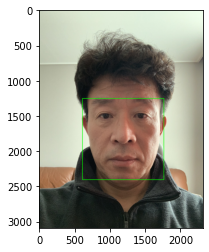

In [6]:
# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   

for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

- Dlib은 ibug 300-W 데이터셋으로 학습한 pretrained model 을 제공  
- 학습 알고리즘은 regression tree의 앙상블 모델 사용  
- 공개되어 있는 weight file 다운로드
- 해당 모델파일은 bz2 압축파일 형태로 제공되어 압축을 풀어준 후 사용  
  
`$ wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
$ mv shape_predictor_68_face_landmarks.dat.bz2 ~/aiffel/camera_sticker/models
$ cd ~/aiffel/camera_sticker && bzip2 -d ./models/shape_predictor_68_face_landmarks.dat.bz2`  

### 저장한 landmark 모델을 불러오기

In [7]:
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("🌫🛸")

🌫🛸


### 얼굴 영역 박스 마다 face landmark를 찾아내기

In [8]:
list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


### 랜드마크를 영상에 출력

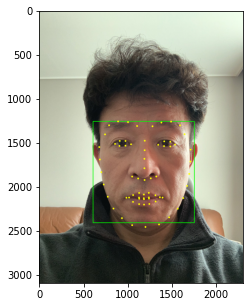

In [9]:
# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 10, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

## Step 3. 스티커 적용 위치 확인하기

- 코의 중심점
- 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
- 스티커 크기 (w, h)  

확인  

In [10]:
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))

(1196, 1785)
(x,y) : (1196,2476)
(w,h) : (1151,1151)


### 준비해 둔 스티커 이미지를 읽어서 적용  
- 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize   

(1151, 1151, 3)


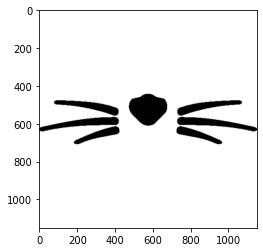

In [11]:
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

- 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
    - 이미지 시작점은 top-left 좌표

In [12]:
# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (621,1325)


- 스티커의 시작점이 얼굴 사진의 영역을 벗어나는 경우 음수로 표현  
- 음수에 대한 예외 처리  
    - 원본 이미지의 범위를 벗어난 스티커 부분을 제거

In [13]:
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (621,1325)


## Step 4. 원본 이미지에 스티커 적용하기

In [14]:
# 길어서 복잡해 보이지만 img_show[from:to] 형식입니다
sticker_area = img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,sticker_area,img_sticker).astype(np.uint8)
print("슝~")

슝~


### 결과 이미지 출력

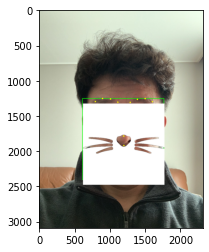

In [15]:
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### bounding box와 landmark를 제거하고 최종 결과만 출력
- img_show 대신, 지금까지 아껴 두었던 img_rgb 활용

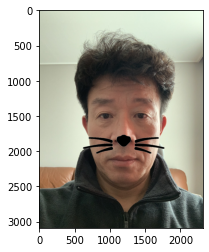

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [16]:
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()
plt.figure(figsize=(10,10))

## 사진 바꾸면서 적용하기 1. 오른쪽에서 촬영

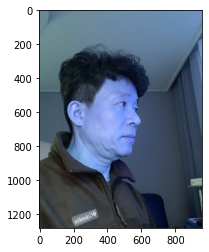

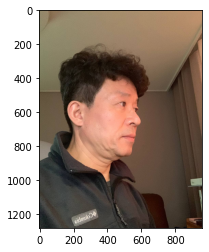

🌫🛸
🌫🛸
rectangles[[(332, 418) (718, 804)]]


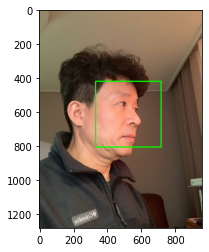

🌫🛸
68


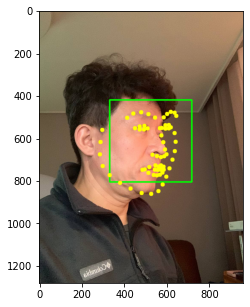

(592, 651)
(x,y) : (592,883)
(w,h) : (387,387)
(387, 387, 3)


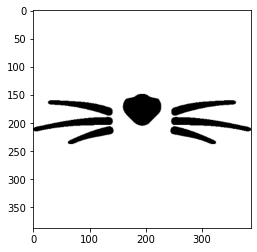

(x,y) : (399,496)
(x,y) : (399,496)


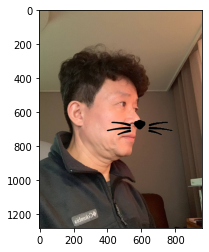

In [17]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-right.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 10, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 2. 왼쪽에서 촬영

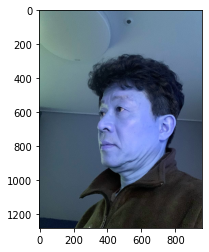

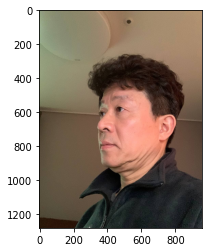

🌫🛸
🌫🛸
rectangles[[(194, 451) (656, 913)]]


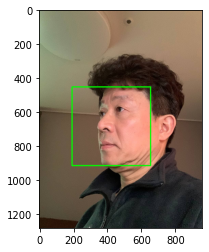

🌫🛸
68


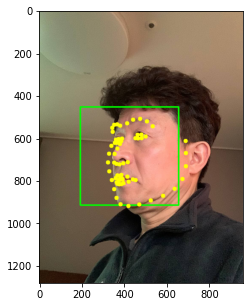

(355, 672)
(x,y) : (355,949)
(w,h) : (463,463)
(463, 463, 3)


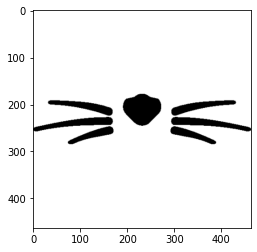

(x,y) : (124,486)
(x,y) : (124,486)


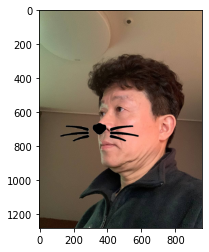

In [18]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-left.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 10, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 3. 위쪽에서 촬영

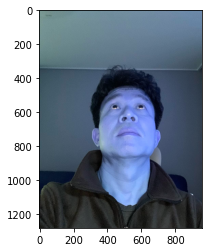

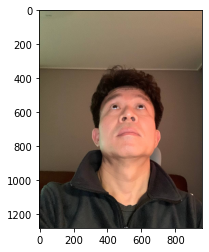

🌫🛸
🌫🛸
rectangles[[(332, 461) (718, 846)]]


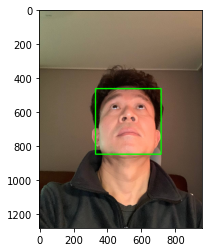

🌫🛸
68


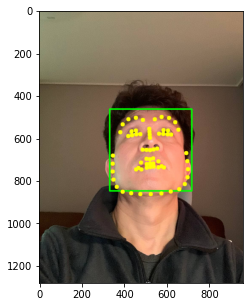

(521, 596)
(x,y) : (521,827)
(w,h) : (387,387)
(387, 387, 3)


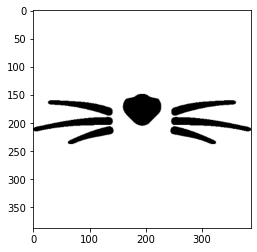

(x,y) : (328,440)
(x,y) : (328,440)


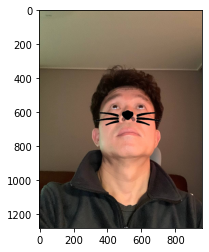

In [19]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-up.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 10, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 4. 아래쪽에서 촬영

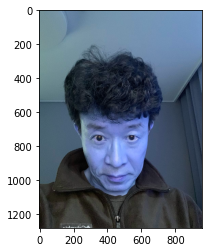

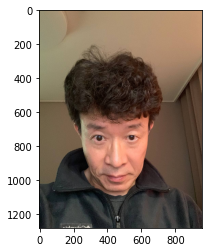

🌫🛸
🌫🛸
rectangles[[(247, 675) (632, 1060)]]


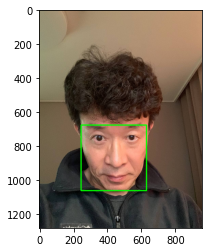

🌫🛸
68


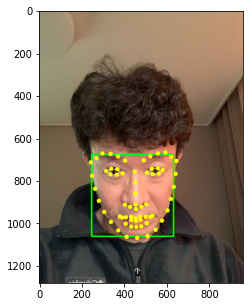

(454, 909)
(x,y) : (454,1140)
(w,h) : (386,386)
(386, 386, 3)


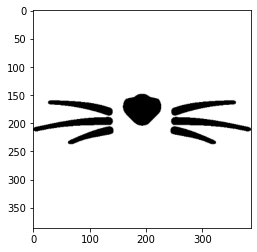

(x,y) : (261,754)
(x,y) : (261,754)


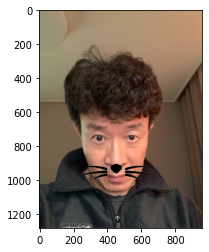

In [20]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-down.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 10, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 5. 옆에서 촬영 1

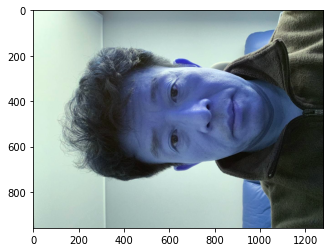

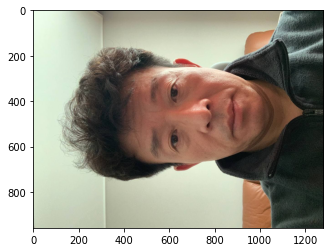

1. 🌫🛸
2. 🌫🛸
rectangles[]


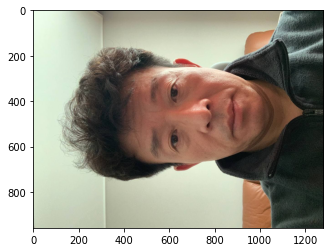

3. 🌫🛸


IndexError: list index out of range

In [21]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-side.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("1. 🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("2. 🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("3. 🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 10, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 6. 옆에서 촬영 2

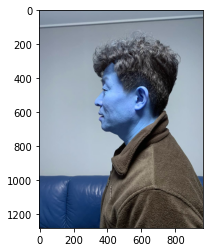

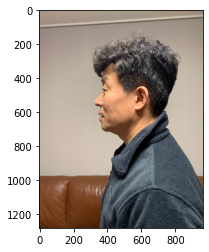

1. 🌫🛸
2. 🌫🛸
rectangles[]


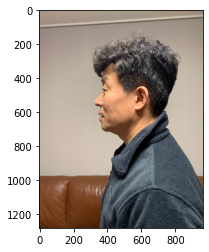

3. 🌫🛸


IndexError: list index out of range

In [27]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-left2.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("1. 🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("2. 🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("3. 🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 10, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 7. 멀리서 촬영 1

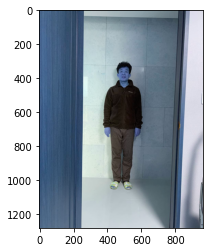

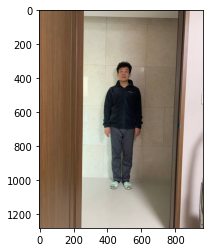

1. 🌫🛸
2. 🌫🛸
rectangles[[(467, 343) (529, 405)]]


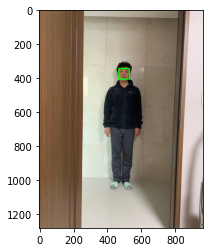

3. 🌫🛸
68


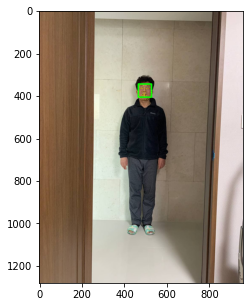

(495, 373)
(x,y) : (495,410)
(w,h) : (63,63)
(63, 63, 3)


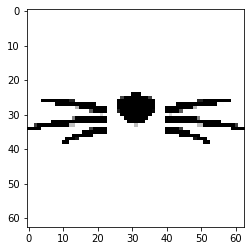

(x,y) : (464,347)
(x,y) : (464,347)


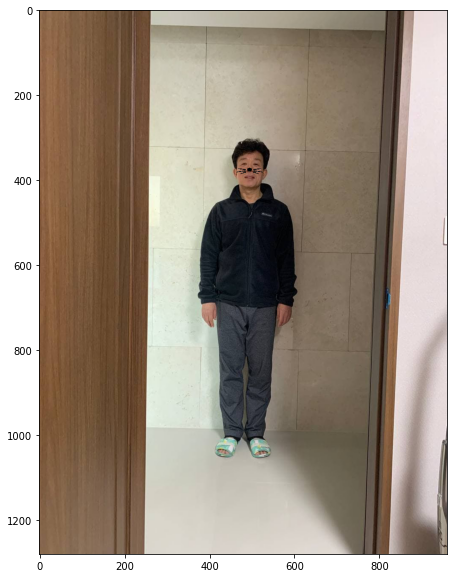

In [22]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-far1.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("1. 🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("2. 🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("3. 🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 1, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 8. 멀리서 촬영 2

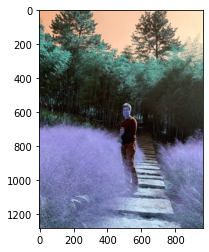

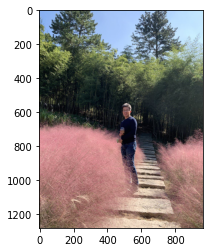

1. 🌫🛸
2. 🌫🛸
rectangles[[(487, 578) (530, 622)]]


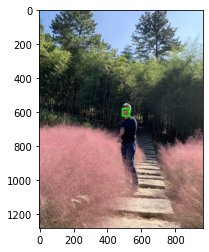

3. 🌫🛸
68


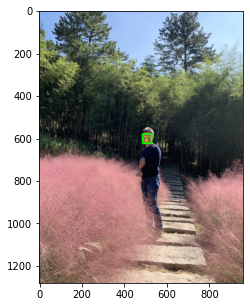

(506, 598)
(x,y) : (506,625)
(w,h) : (44,44)
(44, 44, 3)


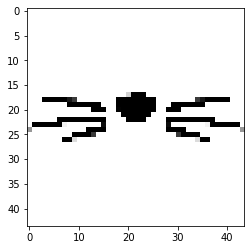

(x,y) : (484,581)
(x,y) : (484,581)


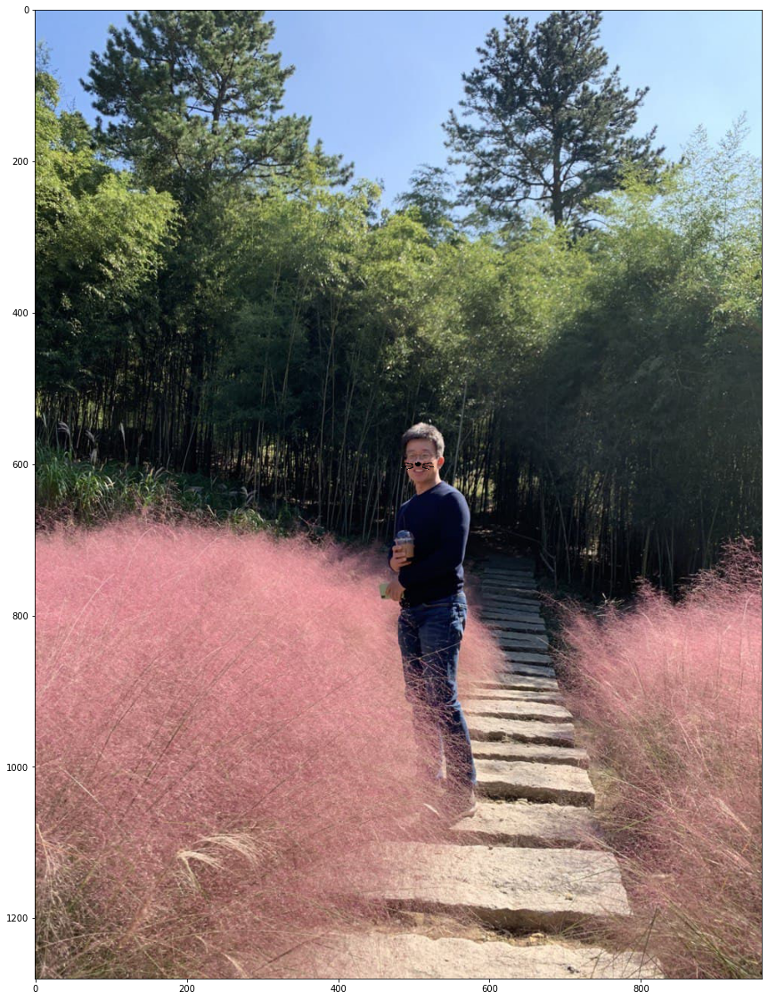

In [23]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-far2.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("1. 🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("2. 🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("3. 🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 1, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 9. 멀리서 촬영 3

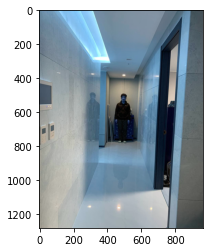

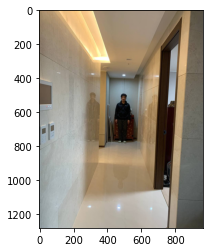

1. 🌫🛸
2. 🌫🛸
rectangles[]


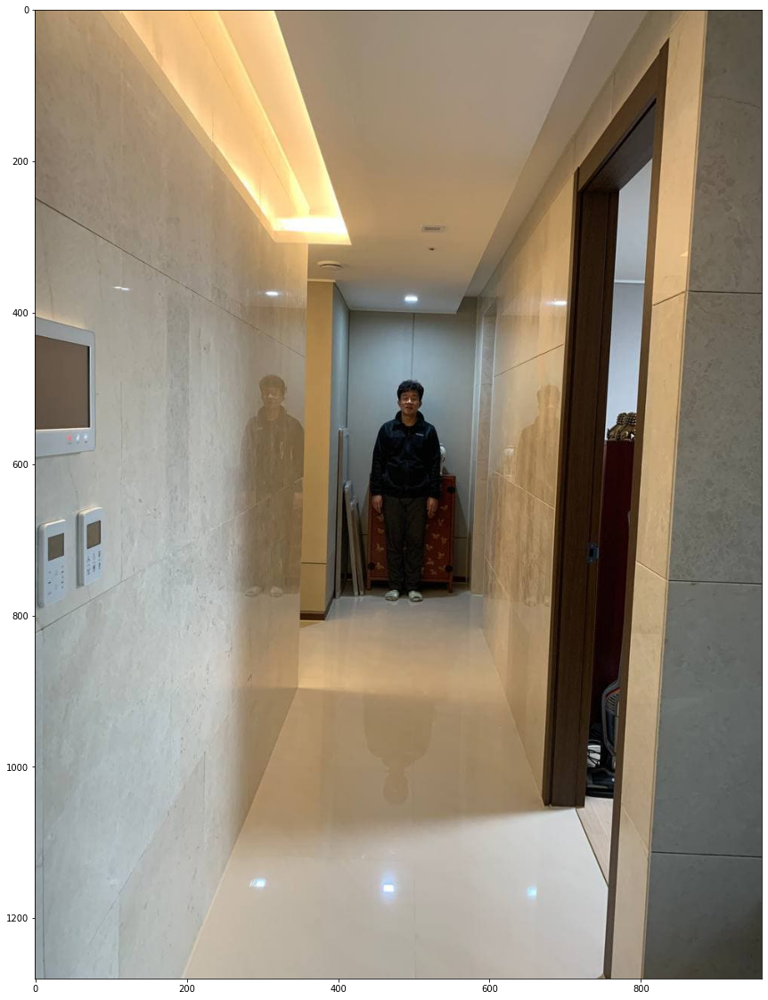

3. 🌫🛸


IndexError: list index out of range

In [24]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-far3.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("1. 🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("2. 🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,20))
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("3. 🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 1, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 사진 바꾸면서 적용하기 10. 멀리서 촬영 4

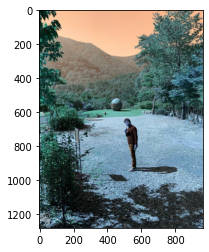

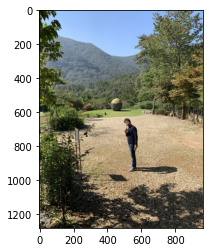

1. 🌫🛸
2. 🌫🛸
rectangles[]


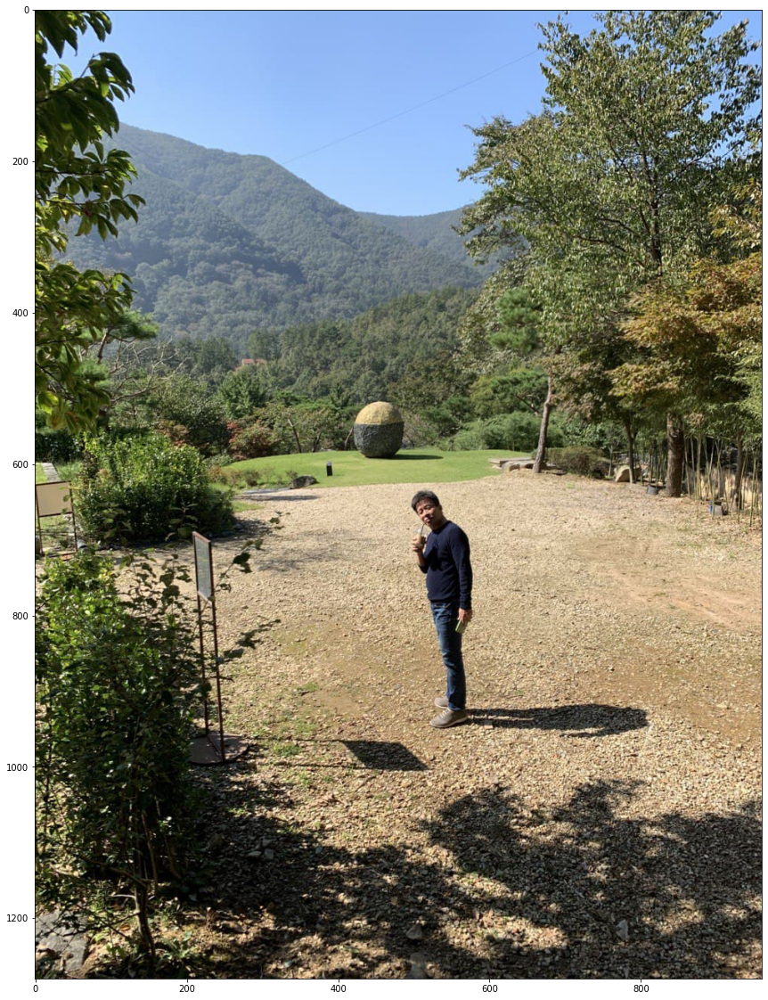

3. 🌫🛸


IndexError: list index out of range

In [26]:
# ===============================================================
# 사진 읽어오기 - 파일 이름 변경
# ===============================================================
my_image_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/selfie-far4.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_bgr = cv2.resize(img_bgr, (3000,3000))
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.figure(figsize=(10,10))
plt.imshow(img_bgr)
plt.show()

# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()
print("1. 🌫🛸")

# detector_hog를 이용해서 얼굴의 bounding box를 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)
print("2. 🌫🛸")

# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 5, lineType=cv2.LINE_AA)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,20))
plt.imshow(img_show_rgb)
plt.show()

# 저장한 landmark 모델을 불러오기
model_path = os.getenv('HOME')+'/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)
print("3. 🌫🛸")

list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

# 랜드마크를 영상에 출력
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 1, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img_show_rgb)
plt.show()

# ============================================================
# Step 3. 스티커 적용 위치 확인하기
# - 코의 중심점
# - 스티커 위치 (x, y): x = x(nose), y = y(nose)+height*3/5
# - 스티커 크기 (w, h)  
# ============================================================

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0]
#    y = landmark[30][1] - dlib_rect.height()//2
    y = landmark[30][1] + int(dlib_rect.height()*3/5)
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))
    
# 고양이 수염 이미지를 읽고 윗 단계에서 계산한 크기로 resize
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)
plt.imshow(img_sticker)
plt.show()

# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정
refined_x = x - w // 2
refined_y = y - h
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# 음수에 대한 예외 처리: 원본 이미지의 범위를 벗어난 스티커 부분을 제거
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

# bounding box와 landmark를 제거하고 최종 결과만 출력
# - img_show 대신, 지금까지 아껴 두었던 img_rgb 활용
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
# np.where(img_sticker==255,sticker_area, cv2.addWeighted(img_sticker, 0.2, sticker_area,0.2, 0)).astype(np.uint8)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

## 문제점 찾아보기

다음과 같이 사진을 바꾸어서 스티커를 반복 적용하였음  
  
0. 정면에서 촬영한 사진 (기본)  
1. 오른쪽에서 촬영한 사진: face landmark detection 가능  
2. 왼쪽에서 촬영한 사진: face landmark detection 가능  
3. 위에서 촬영한 사진: face landmark detection 가능  
4. 아래쪽에서 촬영한 사진: face landmark detection 가능  
5. 정면 사진을 90도 옆으로 회전한 사진: face landmark detection <span style="color:red">불능 (육안으로는 가능하나, 알고리즘은 불능)</span>  
6. 옆쪽에서 촬영한 사진: face landmark detection <span style="color:red">불능 (육안으로는 가능하나, 알고리즘은 불능)</span>  
7. 멀리서 촬영한 사진 1: face landmark detection 가능  
8. 멀리서 촬영한 사진 2: face landmark detection 가능  
9. 멀리서 촬영한 사진 3: face landmark detection <span style="color:red">불능</span>
10. 멀리서 촬영한 사진 4: face landmark detection <span style="color:red">불능</span>

### 결과 분석 종합
- 사진에서 face landmark를 찾아내지 못하는 경우 에러 발생 (5, 6, 9, 10번 경우)
- 촬영한 거리, 명암과는 무관하며 face landmark detection 여부가 관건임
    - 상대적으로 가까운 거리라도 어두우면 못찾음 (9번 경우)
    - 먼 거리라도 해상도가 높으면 찾음 (8번 경우)
    - 가깝고 선명하더라도 눈 2개, 귀 2개가 모두 보이지 않으면 못찾음 (6번 경우)
    - 선명한 사진이라로 얼굴을 옆으로 회전시키면 못찾음 (5번 경우)
        - 사람은 찾을 수 있으나 알고리즘이 못찾음
- face landmark detection이 되는, 얼굴이 오른쪽/왼쪽/위/아래에서 촬영한 사진 적용시  
    - 얼굴은 오른쪽/왼쪽/위/아래 방향을 향하고 있으나
    - 스티커 사진은 정면을 향하고 있어서
    - 스티커 사진의 보정이 필요함. 즉, 사진의 얼굴이 회전한 각도만큼 스티커 사진도 회전시켜서 적용해야 함
- face landmark detection이 되는, 멀리서 촬영한 사진 적용시  
    - 얼굴의 크기에 맞게 스티커 사진이 resize되어 잘 적용됨  
